![](https://savingexpert.org/wp-content/uploads/2018/11/prosper-personal-loans-reviews.png)

<h2 align = 'center'>Predicting the good Client to take a loan  or not </h2>

###### Visit me and give me your feedback : https://www.linkedin.com/in/ahmed-ayman-b8ba231bb/
## Updated: March 23, 2023

# Dataset Overview


This data set includes customers who have paid off their loans, who have been past due and put into collection without paying back their loan and interests, and who have paid off only after they were put in collection. The original dataset contains 113937 rows and 81 columns out of which 12 features of intrest were selected. Data collected to August 2022.


## Importing

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
data= pd.read_csv(r'prosperLoanData.csv')


In [3]:
def data_info (data):
    column = []
    dtype = []
    nunique = []
    unique = []
    nulls = []
    
    for col in data.columns:
        column.append(col)
        dtype.append(data[col].dtype)
        nunique.append(data[col].nunique())
        unique.append(data[col].unique())
        nulls.append(data[col].isna().sum())

    data_info = {'Column' : column , 'Data Type' :dtype ,'nunique':nunique, 'unique':unique 
                , 'Nulls' : nulls }
    data = pd.DataFrame(data_info)
    return data

In [4]:
pd.set_option('display.max_rows', None)
data_info(data)


,Column,Data Type,nunique,unique,Nulls
0,ListingKey,object,113066,"[1021339766868145413AB3B, 10273602499503308B22...",0
1,ListingNumber,int64,113066,"[193129, 1209647, 81716, 658116, 909464, 10748...",0
2,ListingCreationDate,object,113064,"[2007-08-26 19:09:29.263000000, 2014-02-27 08:...",0
3,CreditGrade,object,8,"[C, nan, HR, AA, D, B, E, A, NC]",84984
4,Term,int64,3,"[36, 60, 12]",0
5,LoanStatus,object,12,"[Completed, Current, Past Due (1-15 days), Def...",0
6,ClosedDate,object,2802,"[2009-08-14 00:00:00, nan, 2009-12-17 00:00:00...",58848
7,BorrowerAPR,float64,6677,"[0.16516, 0.12016, 0.28269, 0.12528, 0.24614, ...",25
8,BorrowerRate,float64,2294,"[0.158, 0.092, 0.275, 0.0974, 0.2085, 0.1314, ...",0
9,LenderYield,float64,2283,"[0.138, 0.082, 0.24, 0.0874, 0.1985, 0.1214, 0...",0


In [5]:
data['LoanStatus'].unique()

array(['Completed', 'Current', 'Past Due (1-15 days)', 'Defaulted',
       'Chargedoff', 'Past Due (16-30 days)', 'Cancelled',
       'Past Due (61-90 days)', 'Past Due (31-60 days)',
       'Past Due (91-120 days)', 'FinalPaymentInProgress',
       'Past Due (>120 days)'], dtype=object)

In [6]:
pd.set_option('display.max_columns', None)
data.head()

,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),BorrowerState,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,GroupKey,DateCreditPulled,CreditScoreRangeLower,CreditScoreRangeUpper,FirstRecordedCreditLine,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,LoanKey,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,LoanOriginationDate,LoanOriginationQuarter,MemberKey,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,1021339766868145413AB3B,193129,2007-08-26 19:09:29.263000000,C,36,Completed,2009-08-14 00:00:00,0.16516,0.1580,0.1380,NaN,NaN,NaN,NaN,NaN,NaN,0,CO,Other,Self-employed,2.0,True,True,NaN,2007-08-26 18:41:46.780000000,640.0,659.0,2001-10-11 00:00:00,5.0,4.0,12.0,1,24.0,3.0,3.0,2.0,472.0,4.0,0.0,0.0,0.0,0.00,1500.0,11.0,0.81,0.0,0.17,"$25,000-49,999",True,3083.333333,E33A3400205839220442E84,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,78,19141,9425,2007-09-12 00:00:00,Q3 2007,1F3E3376408759268057EDA,330.43,11396.14,9425.00,1971.14,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,10273602499503308B223C1,1209647,2014-02-27 08:28:07.900000000,NaN,36,Current,NaN,0.12016,0.0920,0.0820,0.07960,0.0249,0.05470,6.0,A,7.0,2,CO,Professional,Employed,44.0,False,False,NaN,2014-02-27 08:28:14,680.0,699.0,1996-03-18 00:00:00,14.0,14.0,29.0,13,389.0,3.0,5.0,0.0,0.0,0.0,1.0,0.0,3989.0,0.21,10266.0,29.0,1.00,2.0,0.18,"$50,000-74,999",True,6125.000000,9E3B37071505919926B1D82,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0,134815,10000,2014-03-03 00:00:00,Q1 2014,1D13370546739025387B2F4,318.93,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
2,0EE9337825851032864889A,81716,2007-01-05 15:00:47.090000000,HR,36,Completed,2009-12-17 00:00:00,0.28269,0.2750,0.2400,NaN,NaN,NaN,NaN,NaN,NaN,0,GA,Other,Not available,NaN,False,True,783C3371218786870A73D20,2007-01-02 14:09:10.060000000,480.0,499.0,2002-07-27 00:00:00,NaN,NaN,3.0,0,0.0,0.0,1.0,1.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.06,Not displayed,True,2083.333333,6954337960046817851BCB2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,86,6466,3001,2007-01-17 00:00:00,Q1 2007,5F7033715035555618FA612,123.32,4186.63,3001.00,1185.63,-24.20,0.0,0.0,0.0,0.0,1.0,0,0,0.0,41
3,0EF5356002482715299901A,658116,2012-10-22 11:02:35.010000000,NaN,36,Current,NaN,0.12528,0.0974,0.0874,0.08490,0.0249,0.06000,6.0,A,9.0,16,GA,Skilled Labor,Employed,113.0,True,False,NaN,2012-10-22 11:02:32,800.0,819.0,1983-02-28 00:00:00,5.0,5.0,29.0,7,115.0,0.0,1.0,4.0,10056.0,14.0,0.0,0.0,1444.0,0.04,30754.0,26.0,0.76,0.0,0.15,"$25,000-49,999",True,2875.000000,A0393664465886295619C51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,16,77296,10000,2012-11-01 00:00:00,Q4 2012,9ADE356069835475068C6D2,321.45,5143.20,4091.09,1052.11,-108.01,0.0,0.0,0.0,0.0,1.0,0,0,0.0,158
4,0F023589499656230C5E3E2,909464,2013-09-14 18:38:39.097000000,NaN,36,Current,NaN,0.24614,0.2085,0.1985,0.18316,0.0925,0.09066,3.0,D,4.0,2,MN

In [7]:
data.describe()

,ListingNumber,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperScore,ListingCategory (numeric),EmploymentStatusDuration,CreditScoreRangeLower,CreditScoreRangeUpper,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,StatedMonthlyIncome,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
count,1.139370e+05,113937.000000,113912.000000,113937.000000,113937.000000,84853.000000,84853.000000,84853.000000,84853.000000,84853.000000,113937.000000,106312.000000,113346.000000,113346.000000,106333.000000,106333.000000,113240.000000,113937.00000,113937.000000,113240.000000,112778.000000,113240.000000,106315.000000,112947.000000,113240.000000,106333.000000,1.063330e+05,106333.000000,106393.000000,106393.000000,106393.000000,106393.000000,105383.000000,1.139370e+05,22085.000000,22085.000000,22085.000000,22085.000000,22085.000000,22085.000000,22085.000000,18928.000000,113937.000000,16952.000000,113937.000000,113937.000000,113937.00000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000
mean,6.278857e+05,40.830248,0.218828,0.192764,0.182701,0.168661,0.080306,0.096068,4.072243,5.950067,2.774209,96.071582,685.567731,704.567731,10.317192,9.260164,26.754539,6.96979,398.292161,1.435085,5.584405,0.592052,984.507059,4.154984,0.312646,0.015094,1.759871e+04,0.561309,11210.225447,23.230034,0.885897,0.802327,0.275947,5.608026e+03,1.421100,22.934345,22.271949,0.613629,0.048540,8472.311961,2930.313906,-3.223214,152.816539,16.268464,31.896882,69444.474271,8337.01385,272.475783,4183.079489,3105.536588,1077.542901,-54.725641,-14.242698,700.446342,681.420499,25.142686,0.998584,0.048027,0.023460,16.550751,80.475228
std,3.280762e+05,10.436212,0.080364,0.074818,0.074516,0.068467,0.046764,0.030403,1.673227,2.376501,3.996797,94.480605,66.458275,66.458275,5.457866,5.022644,13.637871,4.63097,447.159711,2.437507,6.429946,1.978707,7158.270157,10.160216,0.727868,0.154092,3.293640e+04,0.317918,19818.361309,11.871311,0.148179,1.097637,0.551759,7.478497e+03,0.764042,19.249584,18.830425,2.446827,0.556285,7395.507650,3806.635075,50.063567,466.320254,9.005898,29.974184,38930.479610,6245.80058,192.697812,4790.907234,4069.527670,1183.414168,60.675425,109.232758,2388.513831,2357.167068,275.657937,0.017919,0.332353,0.232412,294.545422,103.239020
min,4.000000e+00,12.000000,0.006530,0.000000,-0.010000,-0.182700,0.004900,-0.182700,1.000000,1.000000,0.000000,0.000000,0.000000,19.000000,0.000000,0.000000,2.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-209.000000,0.000000,0.000000,0.000000,1.000000,1000.00000,0.000000,-2.349900,0.000000,-2.349900,-664.870000,-9274.750000,-94.200000,-954.550000,0.000000,0.700000,0.000000,0.000000,0.000000,1.000000
25%,4.009190e+05,36.000000

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113937 entries, 0 to 113936
Data columns (total 81 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   ListingKey                           113937 non-null  object 
 1   ListingNumber                        113937 non-null  int64  
 2   ListingCreationDate                  113937 non-null  object 
 3   CreditGrade                          28953 non-null   object 
 4   Term                                 113937 non-null  int64  
 5   LoanStatus                           113937 non-null  object 
 6   ClosedDate                           55089 non-null   object 
 7   BorrowerAPR                          113912 non-null  float64
 8   BorrowerRate                         113937 non-null  float64
 9   LenderYield                          113937 non-null  float64
 10  EstimatedEffectiveYield              84853 non-null   float64
 11  EstimatedLoss

# Handling Target Column

From Bussiness understanding Once a loan reaches 121 days past due, it is charged off.

In [9]:
defa = ['Chargedoff' , 'Past Due (>120 days)' ]

for i in defa:

    data['LoanStatus'][data['LoanStatus'] == i] = 'Defaulted'

/var/folders/zp/513754tn5m7gg_1c1482g26r0000gn/T/ipykernel_2457/709077906.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['LoanStatus'][data['LoanStatus'] == i] = 'Defaulted'


In [10]:
data['LoanStatus'].unique()

array(['Completed', 'Current', 'Past Due (1-15 days)', 'Defaulted',
       'Past Due (16-30 days)', 'Cancelled', 'Past Due (61-90 days)',
       'Past Due (31-60 days)', 'Past Due (91-120 days)',
       'FinalPaymentInProgress'], dtype=object)

In [11]:
non_defa = ['Completed' , 'Past Due (1-15 days)', 
       'Past Due (16-30 days)', 'Past Due (61-90 days)',
       'Past Due (31-60 days)', 'Past Due (91-120 days)','Cancelled']

for j in non_defa:

    data['LoanStatus'][data['LoanStatus'] == j] = 'Non-Defaulted'

/var/folders/zp/513754tn5m7gg_1c1482g26r0000gn/T/ipykernel_2457/1628786983.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['LoanStatus'][data['LoanStatus'] == j] = 'Non-Defaulted'


In [12]:
data['LoanStatus'].unique()

array(['Non-Defaulted', 'Current', 'Defaulted', 'FinalPaymentInProgress'],
      dtype=object)

In [13]:
ind = data[data['LoanStatus'] == 'Current'].index

In [14]:
ind_1 = []
for i in data['LoanCurrentDaysDelinquent'].iloc[ind]:
    if i >= 180 :
        ind_1.append(i)
    else :
        continue

In [15]:
ind_1

[]

In [16]:
ind_2 = data[data['LoanStatus'] == 'FinalPaymentInProgress'].index

In [17]:
ind_3 = []
for i in data['LoanCurrentDaysDelinquent'].iloc[ind_2]:
    if i >= 180 :
        ind_3.append(i)
    else :
        continue

In [18]:
ind_3

[]

### So current and Final Payment in progress is non-defaulter

In [19]:
non_defa = ['Current',  'FinalPaymentInProgress']

for j in non_defa:

    data['LoanStatus'][data['LoanStatus'] == j] = 'Non-Defaulted'

/var/folders/zp/513754tn5m7gg_1c1482g26r0000gn/T/ipykernel_2457/595131973.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['LoanStatus'][data['LoanStatus'] == j] = 'Non-Defaulted'


In [20]:
data['LoanStatus'].unique()

array(['Non-Defaulted', 'Defaulted'], dtype=object)

In [21]:
data['LoanStatus'].nunique()

2

In [22]:
data['LoanStatus'].value_counts()

Non-Defaulted    96911
Defaulted        17026
Name: LoanStatus, dtype: int64

## Drop irrelevant variables

In [23]:
lis = ['ListingKey' , 'ListingNumber' , 'GroupKey' , 'LoanKey' , 'LoanNumber' , 'MemberKey'  ]
for i in lis:

    data.drop(i , axis = 1 , inplace=True)

##  Missing Values 

### 1. Duplicated

In [24]:
data.duplicated().sum()

0

### 2. Null Values 

In [25]:
pd.set_option('display.max_rows', 500)
data.isnull().sum()* 100 / len(data)


ListingCreationDate                     0.000000
CreditGrade                            74.588588
Term                                    0.000000
LoanStatus                              0.000000
ClosedDate                             51.649596
BorrowerAPR                             0.021942
BorrowerRate                            0.000000
LenderYield                             0.000000
EstimatedEffectiveYield                25.526387
EstimatedLoss                          25.526387
EstimatedReturn                        25.526387
ProsperRating (numeric)                25.526387
ProsperRating (Alpha)                  25.526387
ProsperScore                           25.526387
ListingCategory (numeric)               0.000000
BorrowerState                           4.840394
Occupation                              3.149109
EmploymentStatus                        1.979164
EmploymentStatusDuration                6.692295
IsBorrowerHomeowner                     0.000000
CurrentlyInGroup    

In [26]:
lis = ['ScorexChangeAtTimeOfListing' ,'ProsperPrincipalOutstanding' , 'ProsperPrincipalBorrowed' ,
      'ProsperPaymentsOneMonthPlusLate' , 'ProsperPaymentsLessThanOneMonthLate' ,'OnTimeProsperPayments' , 
      'TotalProsperPaymentsBilled' , 'TotalProsperLoans' , 'LoanFirstDefaultedCycleNumber' ,  'CreditGrade' , 'ClosedDate']


data.drop(lis , axis =1 , inplace=True)

In [27]:
data.isna().sum()

ListingCreationDate                       0
Term                                      0
LoanStatus                                0
BorrowerAPR                              25
BorrowerRate                              0
LenderYield                               0
EstimatedEffectiveYield               29084
EstimatedLoss                         29084
EstimatedReturn                       29084
ProsperRating (numeric)               29084
ProsperRating (Alpha)                 29084
ProsperScore                          29084
ListingCategory (numeric)                 0
BorrowerState                          5515
Occupation                             3588
EmploymentStatus                       2255
EmploymentStatusDuration               7625
IsBorrowerHomeowner                       0
CurrentlyInGroup                          0
DateCreditPulled                          0
CreditScoreRangeLower                   591
CreditScoreRangeUpper                   591
FirstRecordedCreditLine         

In [28]:
data.head()

,ListingCreationDate,Term,LoanStatus,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),BorrowerState,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,DateCreditPulled,CreditScoreRangeLower,CreditScoreRangeUpper,FirstRecordedCreditLine,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,LoanCurrentDaysDelinquent,LoanMonthsSinceOrigination,LoanOriginalAmount,LoanOriginationDate,LoanOriginationQuarter,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,2007-08-26 19:09:29.263000000,36,Non-Defaulted,0.16516,0.1580,0.1380,NaN,NaN,NaN,NaN,NaN,NaN,0,CO,Other,Self-employed,2.0,True,True,2007-08-26 18:41:46.780000000,640.0,659.0,2001-10-11 00:00:00,5.0,4.0,12.0,1,24.0,3.0,3.0,2.0,472.0,4.0,0.0,0.0,0.0,0.00,1500.0,11.0,0.81,0.0,0.17,"$25,000-49,999",True,3083.333333,0,78,9425,2007-09-12 00:00:00,Q3 2007,330.43,11396.14,9425.00,1971.14,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,2014-02-27 08:28:07.900000000,36,Non-Defaulted,0.12016,0.0920,0.0820,0.07960,0.0249,0.05470,6.0,A,7.0,2,CO,Professional,Employed,44.0,False,False,2014-02-27 08:28:14,680.0,699.0,1996-03-18 00:00:00,14.0,14.0,29.0,13,389.0,3.0,5.0,0.0,0.0,0.0,1.0,0.0,3989.0,0.21,10266.0,29.0,1.00,2.0,0.18,"$50,000-74,999",True,6125.000000,0,0,10000,2014-03-03 00:00:00,Q1 2014,318.93,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
2,2007-01-05 15:00:47.090000000,36,Non-Defaulted,0.28269,0.2750,0.2400,NaN,NaN,NaN,NaN,NaN,NaN,0,GA,Other,Not available,NaN,False,True,2007-01-02 14:09:10.060000000,480.0,499.0,2002-07-27 00:00:00,NaN,NaN,3.0,0,0.0,0.0,1.0,1.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.06,Not displayed,True,2083.333333,0,86,3001,2007-01-17 00:00:00,Q1 2007,123.32,4186.63,3001.00,1185.63,-24.20,0.0,0.0,0.0,0.0,1.0,0,0,0.0,41
3,2012-10-22 11:02:35.010000000,36,Non-Defaulted,0.12528,0.0974,0.0874,0.08490,0.0249,0.06000,6.0,A,9.0,16,GA,Skilled Labor,Employed,113.0,True,False,2012-10-22 11:02:32,800.0,819.0,1983-02-28 00:00:00,5.0,5.0,29.0,7,115.0,0.0,1.0,4.0,10056.0,14.0,0.0,0.0,1444.0,0.04,30754.0,26.0,0.76,0.0,0.15,"$25,000-49,999",True,2875.000000,0,16,10000,2012-11-01 00:00:00,Q4 2012,321.45,5143.20,4091.09,1052.11,-108.01,0.0,0.0,0.0,0.0,1.0,0,0,0.0,158
4,2013-09-14 18:38:39.097000000,36,Non-Defaulted,0.24614,0.2085,0.1985,0.18316,0.0925,0.09066,3.0,D,4.0,2,MN,Executive,Employed,44.0,True,False,2013-09-14 18:38:44,680.0,699.0,2004-02-20 00:00:00,19.0,19.0,49.0,6,220.0,1.0,9.0,0.0,0.0,0.0,0.0,0.0,6193.0,0.81,695.0,39.0,0.95,2.0,0.26,"$100,000+",True,9583.333333,0,6,15000,2013-09-20 00:00:00,Q3 2013,563.97,2819.85,1563.22,1256.63,-60.27,0.0,0.0,0.0,0.0,1.0,0,0,0.0,20


#### Fill null values in numerical columns with the mean and Fill null values in categorical columns with the mode


In [29]:
num_cols = data.select_dtypes(include=['float64', 'int64']).columns
data[num_cols] = data[num_cols].fillna(data[num_cols].median())

cat_cols = data.select_dtypes(include=['category','object']).columns
data[cat_cols] = data[cat_cols].fillna(data[cat_cols].mode().iloc[0])

In [30]:
pd.set_option('display.max_rows', 500)
data.isnull().sum()

ListingCreationDate                   0
Term                                  0
LoanStatus                            0
BorrowerAPR                           0
BorrowerRate                          0
LenderYield                           0
EstimatedEffectiveYield               0
EstimatedLoss                         0
EstimatedReturn                       0
ProsperRating (numeric)               0
ProsperRating (Alpha)                 0
ProsperScore                          0
ListingCategory (numeric)             0
BorrowerState                         0
Occupation                            0
EmploymentStatus                      0
EmploymentStatusDuration              0
IsBorrowerHomeowner                   0
CurrentlyInGroup                      0
DateCreditPulled                      0
CreditScoreRangeLower                 0
CreditScoreRangeUpper                 0
FirstRecordedCreditLine               0
CurrentCreditLines                    0
OpenCreditLines                       0


### 2. Outliers

/Users/ahmed/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/ahmed/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/ahmed/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar fle

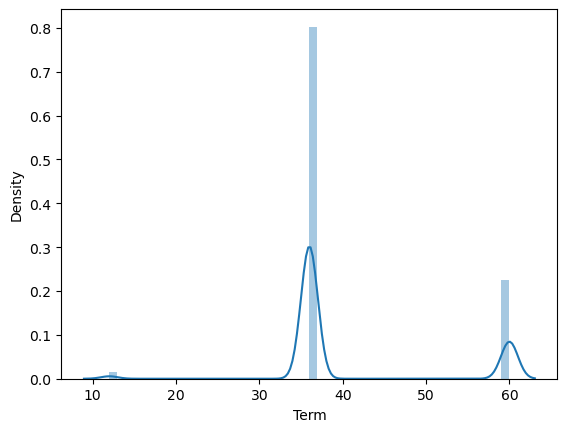

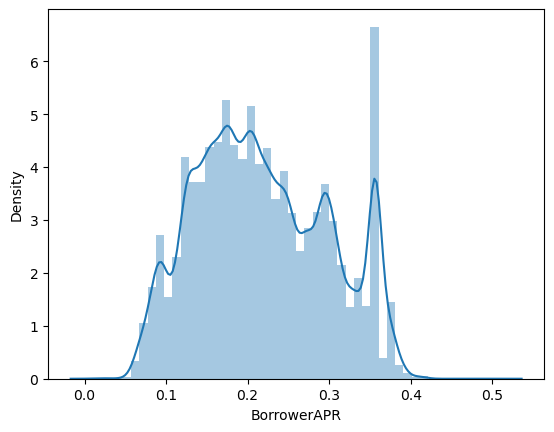

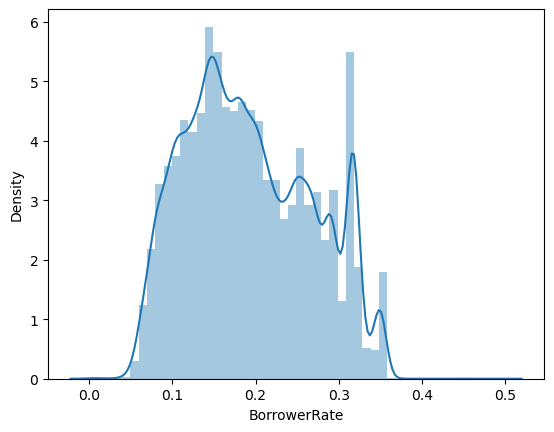

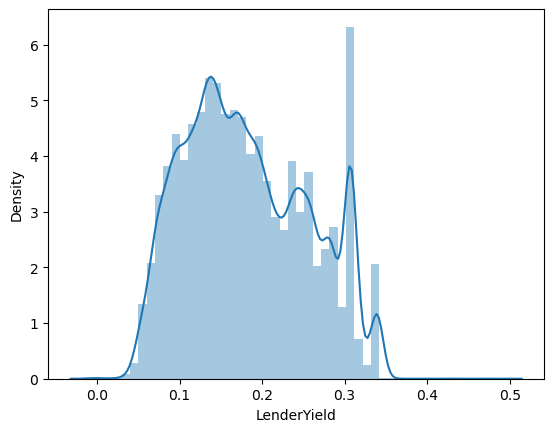

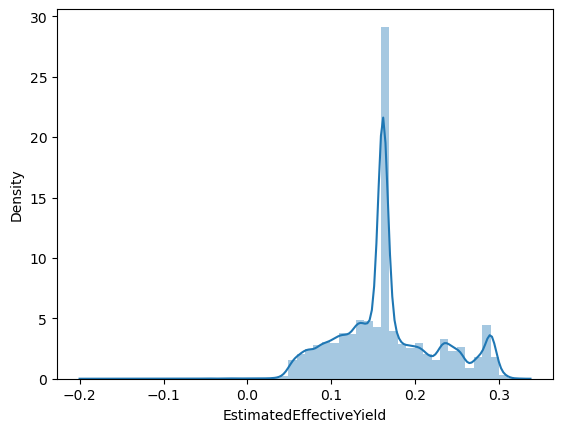

...

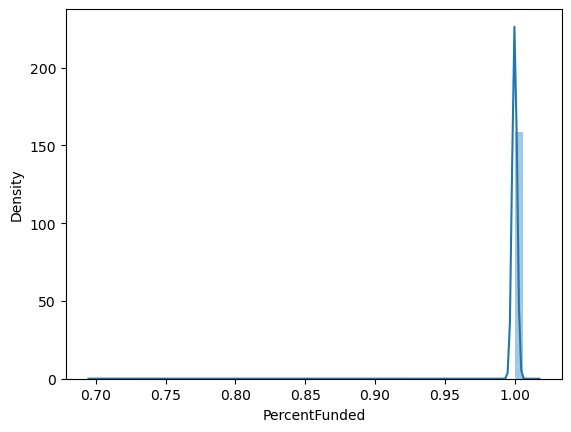

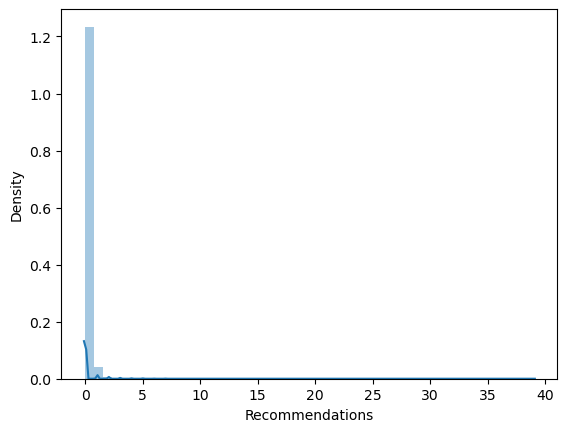

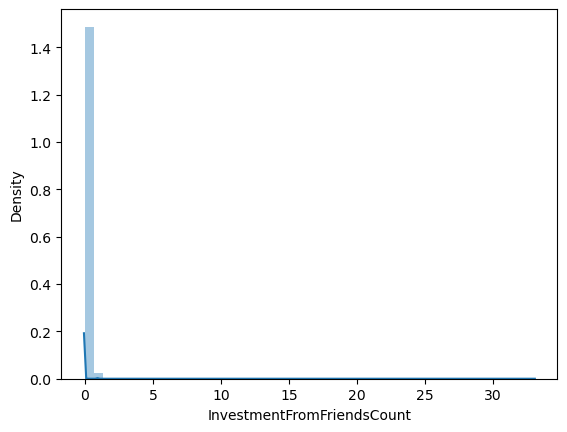

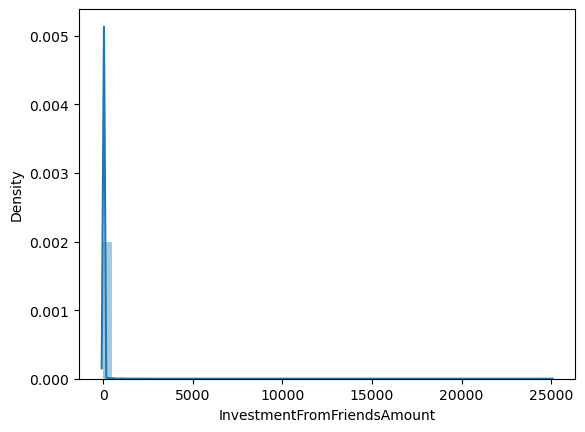

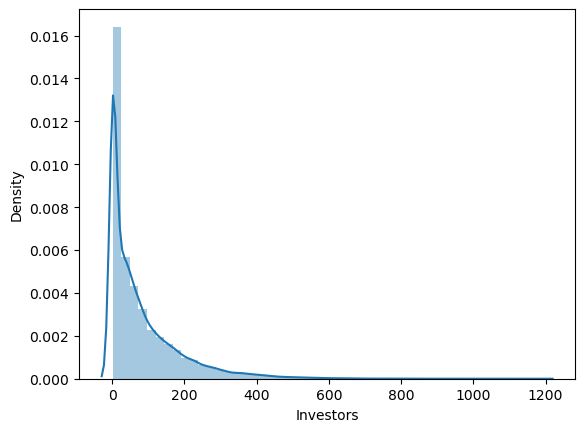

In [31]:
for i in num_cols:
    plt.figure()
    sns.distplot(data[i])

/Users/ahmed/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/ahmed/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/ahmed/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.w

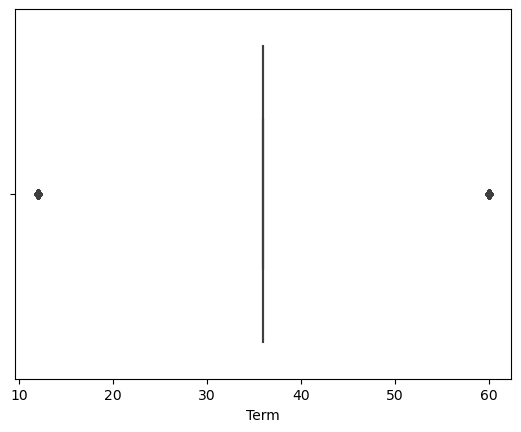

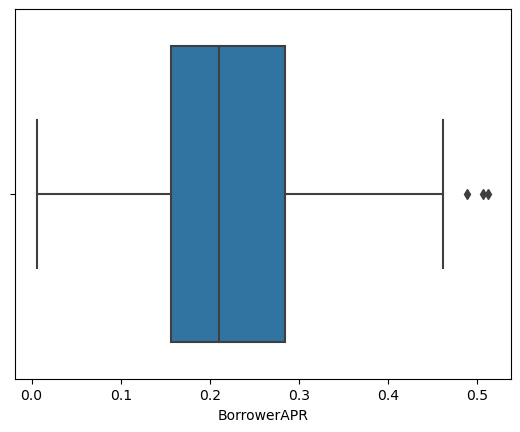

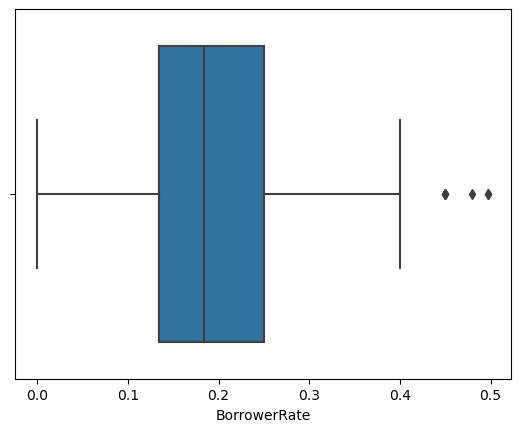

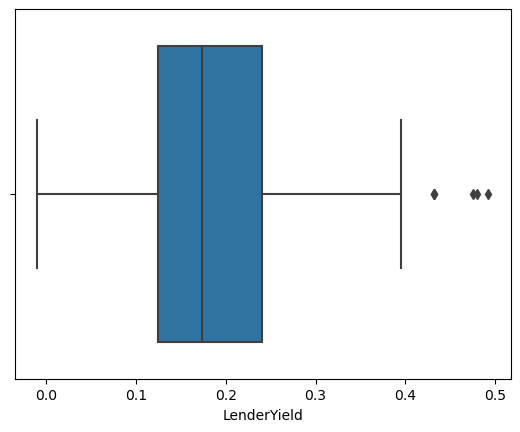

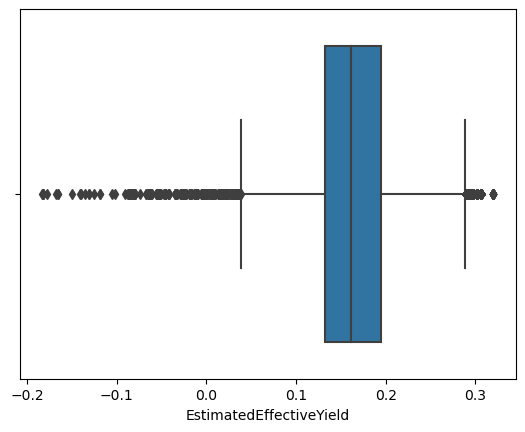

...

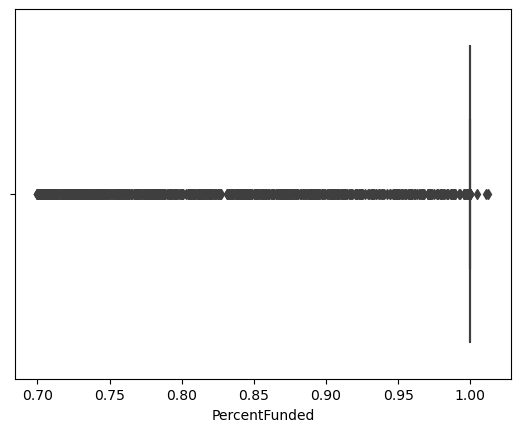

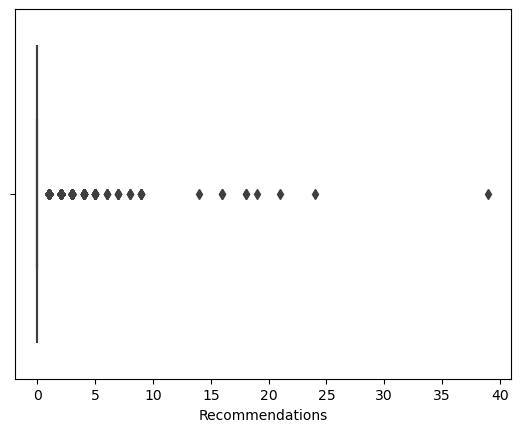

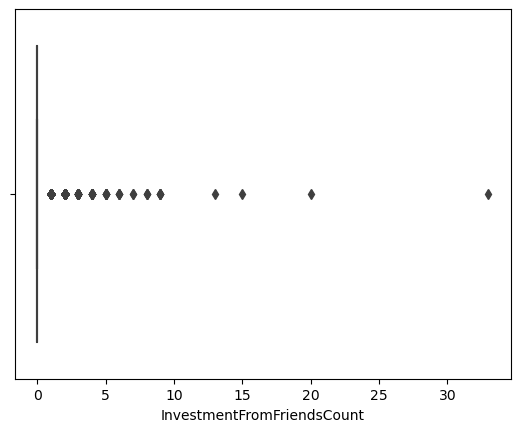

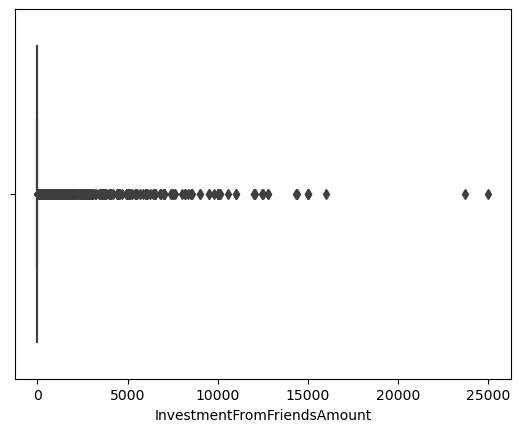

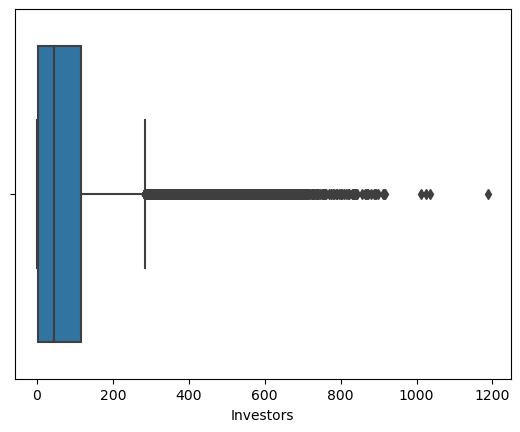

In [32]:
for i in num_cols:
    plt.figure()
    sns.boxplot(data[i])

In [33]:
for i in num_cols :

    Q3 = data[i].quantile(.75)
    Q1 = data[i].quantile(.25)
    IQR = Q3 - Q1 

    upper_whisker = Q3 + 1.5 * IQR
    lower_whisker = Q1 - 1.5 * IQR

    filt2 = data[i] >  upper_whisker 
    filt3 = data[i] <  lower_whisker

    out2 = data[filt2].index
    out3 = data[filt3].index

    data= data.drop(out3 , axis = 0)


In [34]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 89068 entries, 0 to 113936
Data columns (total 64 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   ListingCreationDate                 89068 non-null  object 
 1   Term                                89068 non-null  int64  
 2   LoanStatus                          89068 non-null  object 
 3   BorrowerAPR                         89068 non-null  float64
 4   BorrowerRate                        89068 non-null  float64
 5   LenderYield                         89068 non-null  float64
 6   EstimatedEffectiveYield             89068 non-null  float64
 7   EstimatedLoss                       89068 non-null  float64
 8   EstimatedReturn                     89068 non-null  float64
 9   ProsperRating (numeric)             89068 non-null  float64
 10  ProsperRating (Alpha)               89068 non-null  object 
 11  ProsperScore                        8906

### 3. Missing Data Entry

In [35]:
data['IncomeRange'].unique()

array(['$25,000-49,999', '$50,000-74,999', '$100,000+', '$75,000-99,999',
       'Not displayed', '$1-24,999', '$0', 'Not employed'], dtype=object)

In [36]:
data['IncomeRange'][data['IncomeRange'] == 'Not displayed'] = '$0'
data['IncomeRange'][data['IncomeRange'] == 'Not employed'] = '$0'


/var/folders/zp/513754tn5m7gg_1c1482g26r0000gn/T/ipykernel_2457/3108198338.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['IncomeRange'][data['IncomeRange'] == 'Not displayed'] = '$0'
/var/folders/zp/513754tn5m7gg_1c1482g26r0000gn/T/ipykernel_2457/3108198338.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['IncomeRange'][data['IncomeRange'] == 'Not employed'] = '$0'


In [37]:
data['IncomeRange'].unique()

array(['$25,000-49,999', '$50,000-74,999', '$100,000+', '$75,000-99,999',
       '$0', '$1-24,999'], dtype=object)

### 5. Date Format

In [38]:
data['ListingCreationDate'] = pd.to_datetime(data['ListingCreationDate'])

In [39]:
data['DateCreditPulled'] = pd.to_datetime(data['DateCreditPulled'])

In [40]:
data['FirstRecordedCreditLine'] = pd.to_datetime(data['FirstRecordedCreditLine'])

In [41]:
data['LoanOriginationDate'] = pd.to_datetime(data['LoanOriginationDate'])

# EDA

## Bar plots for all categorical variables

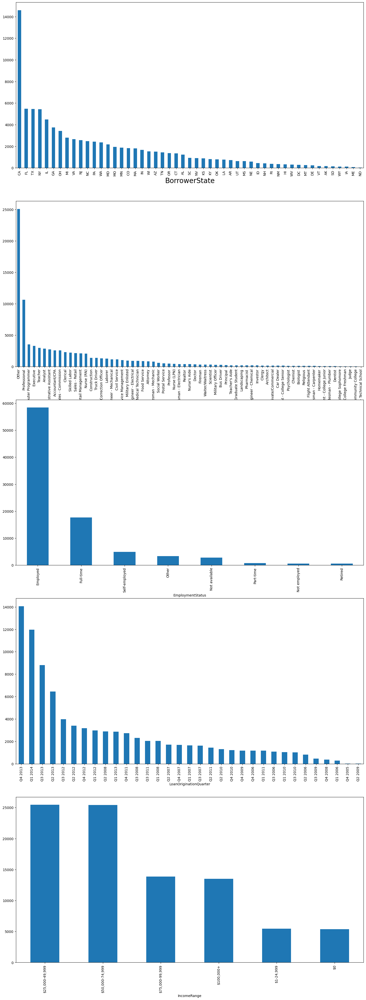

In [42]:
plt.figure(figsize=(18,50))
plt.subplot(5,1,1)
data['BorrowerState'].value_counts().plot.bar()
plt.xlabel('BorrowerState', fontsize=20)

plt.subplot(5,1,2)
data['Occupation'].value_counts().plot.bar()
plt.xlabel('Occupation', fontsize=20)

plt.subplot(5,1,3)
data['EmploymentStatus'].value_counts().plot.bar()
plt.xlabel('EmploymentStatus', fontsize=10)

plt.subplot(5,1,4)
data['LoanOriginationQuarter'].value_counts().plot.bar()
plt.xlabel('LoanOriginationQuarter', fontsize=10)

plt.subplot(5,1,5)
data['IncomeRange'].value_counts().plot.bar()
plt.xlabel('IncomeRange', fontsize=10);  

# Scatter Plots

In [43]:
num = data.select_dtypes('number').columns.to_list()
#numeric dataframe
BM_num =  data[num]

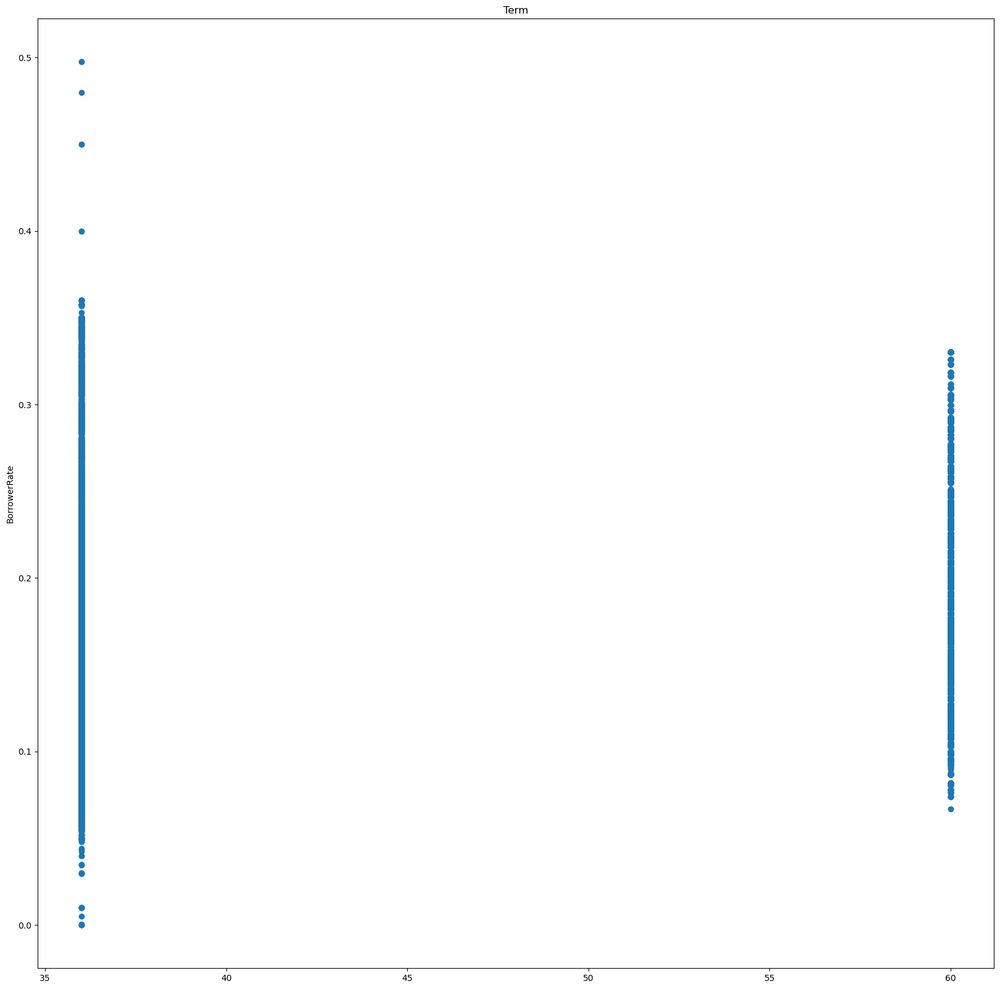

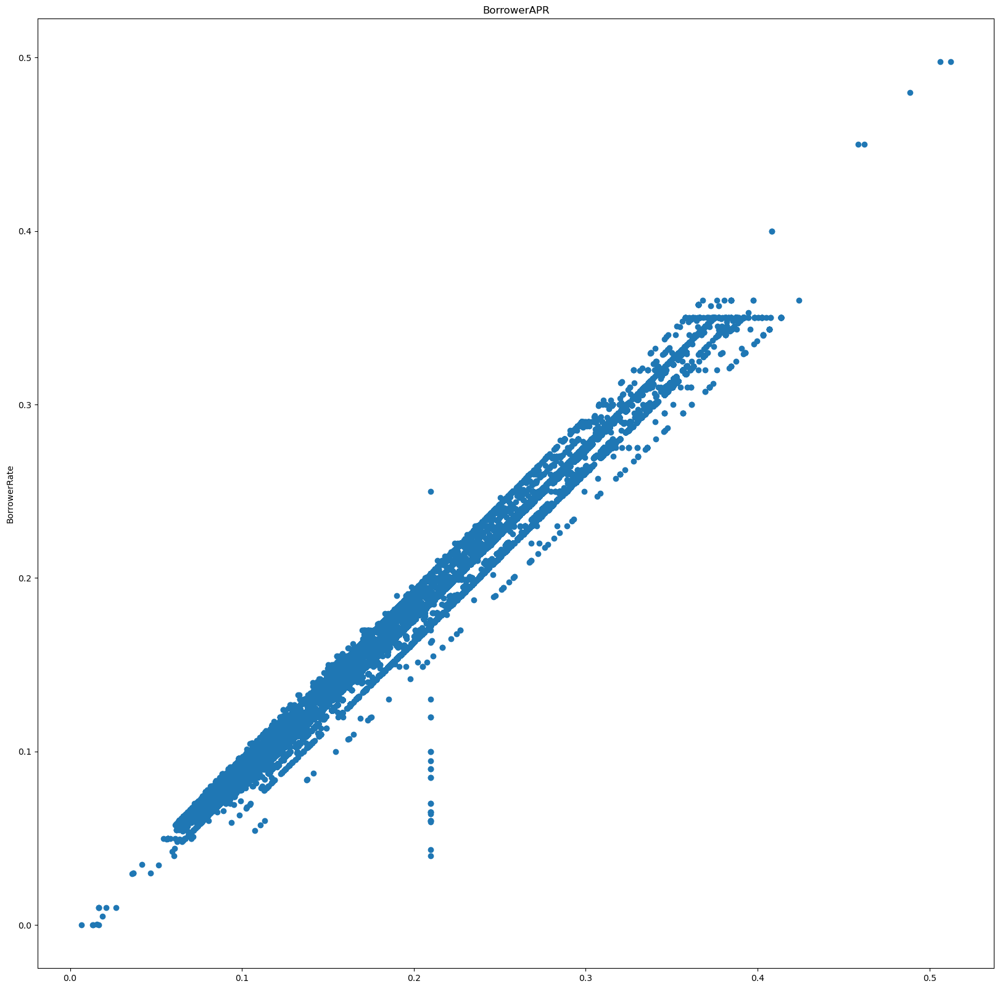

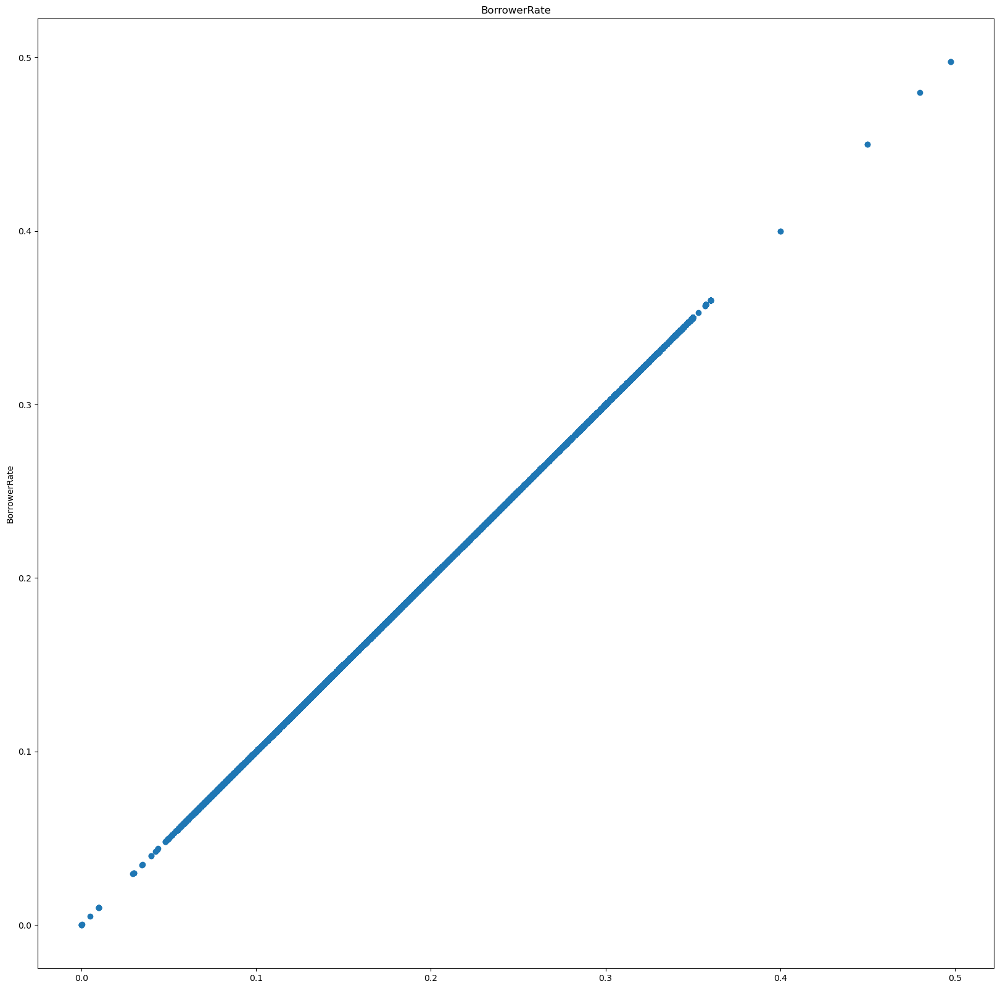

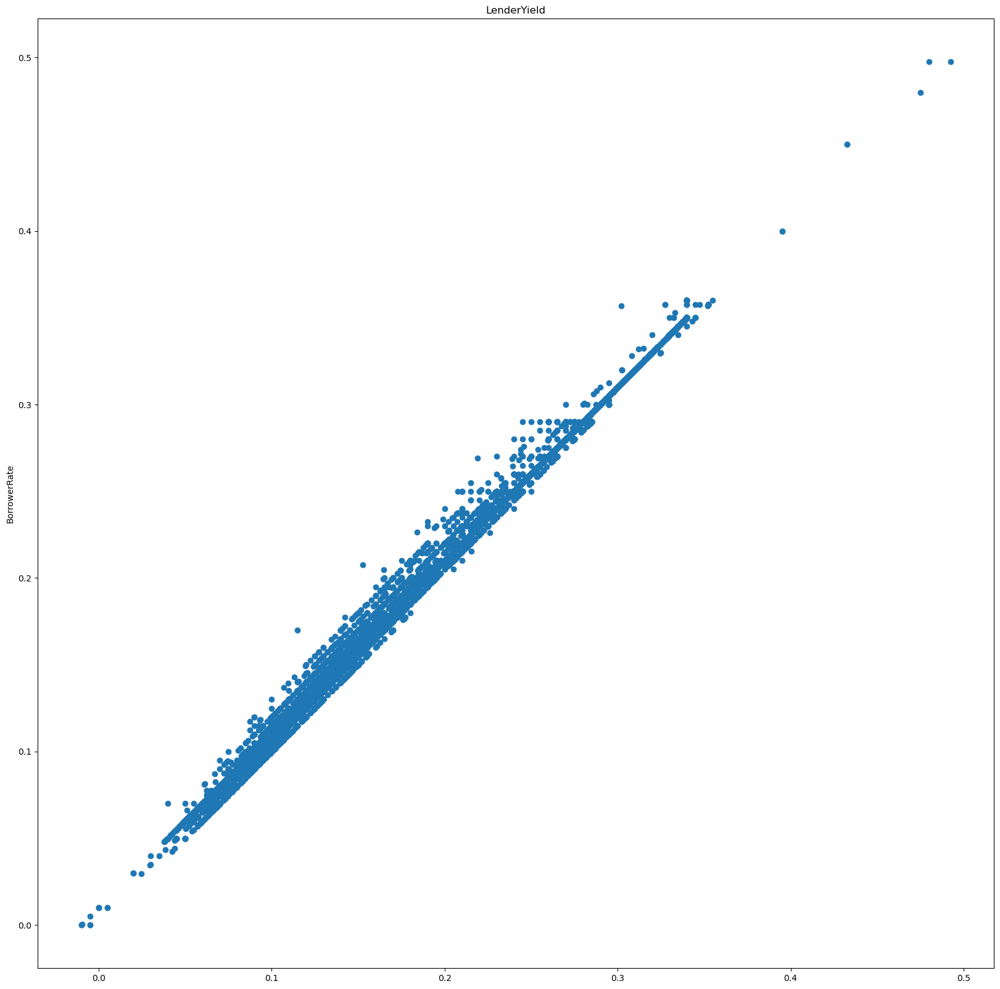

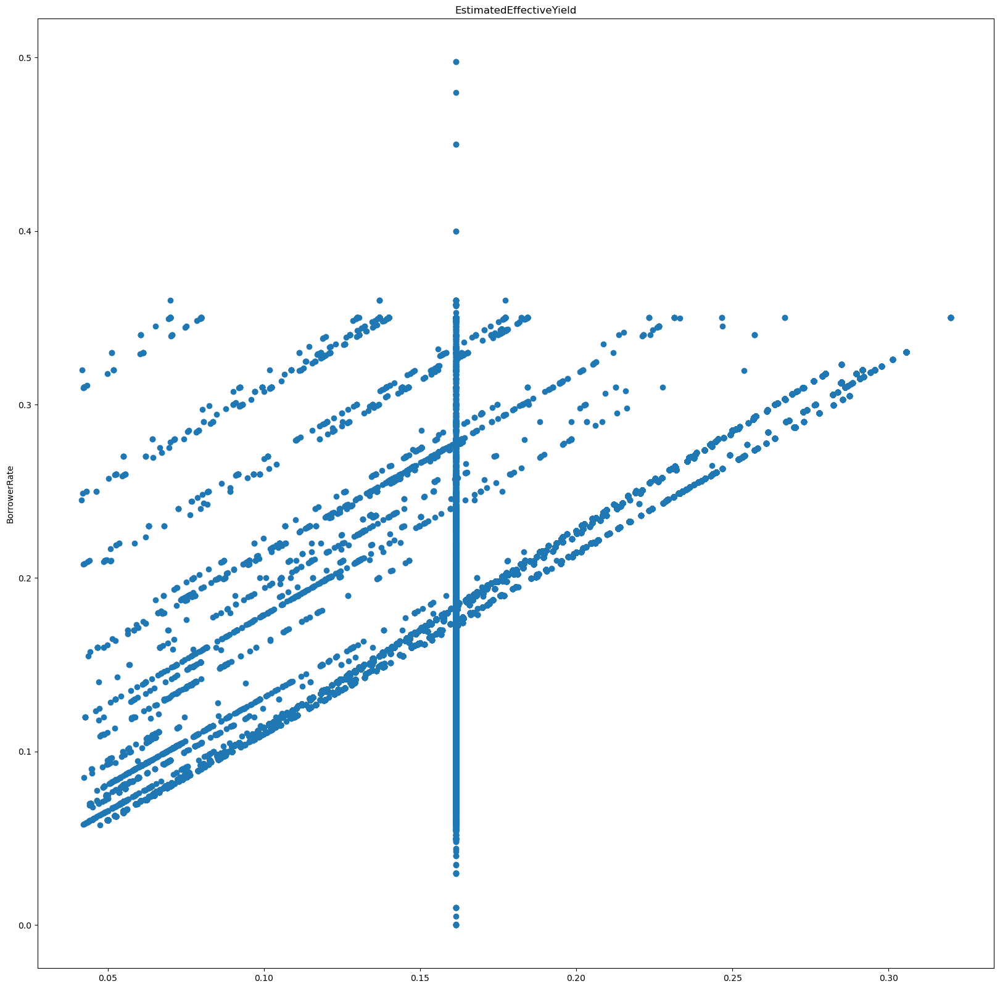

...

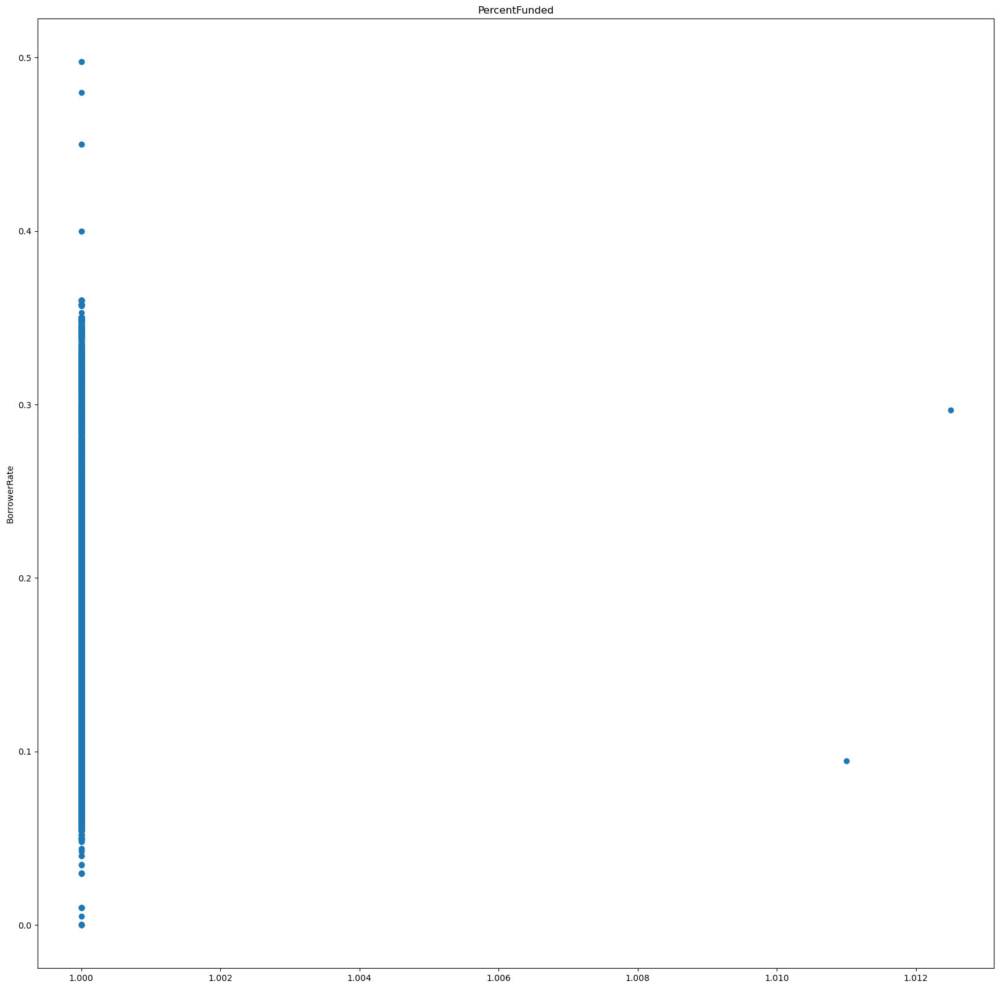

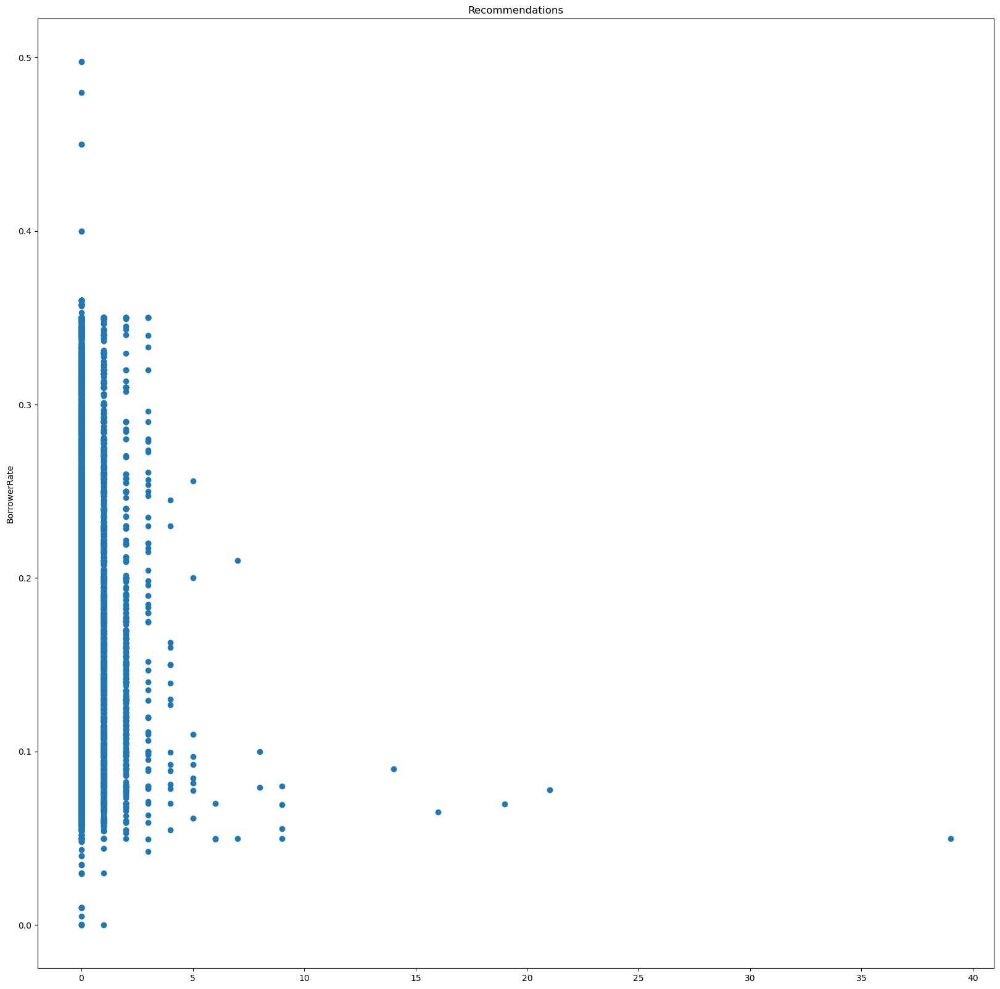

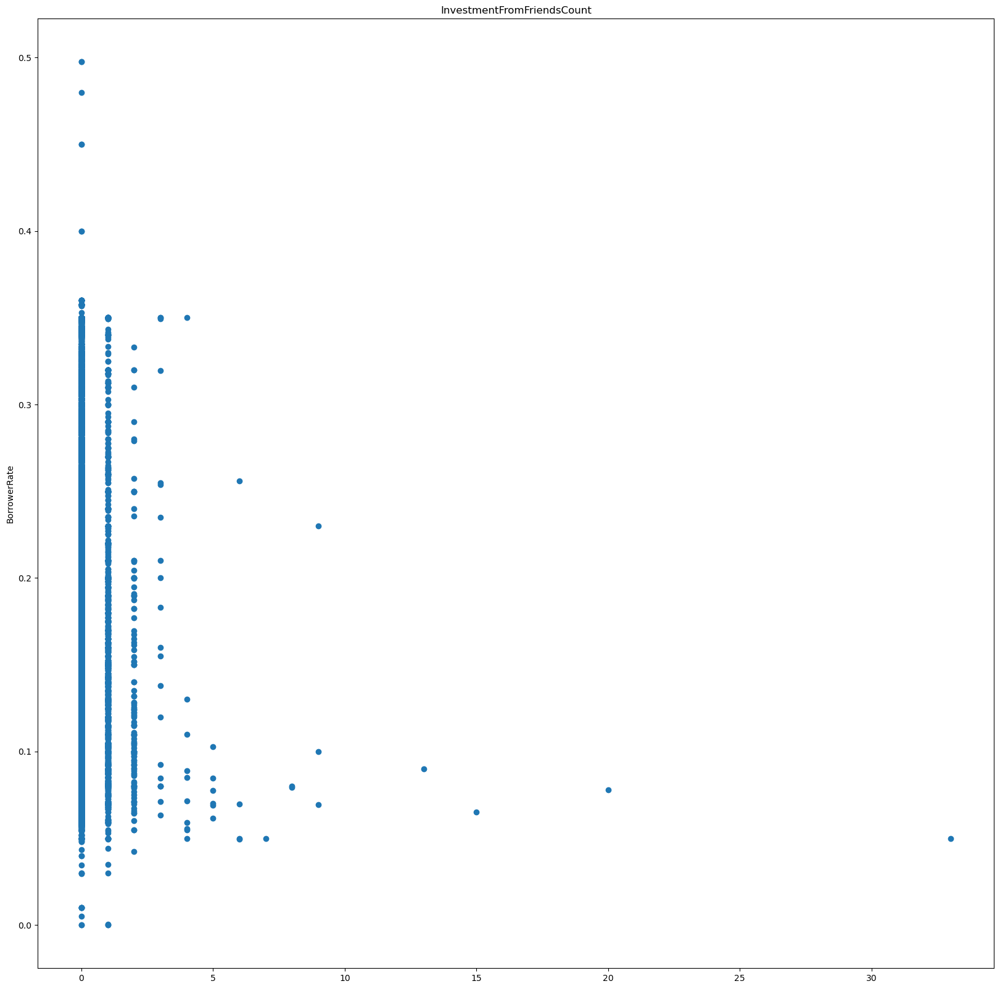

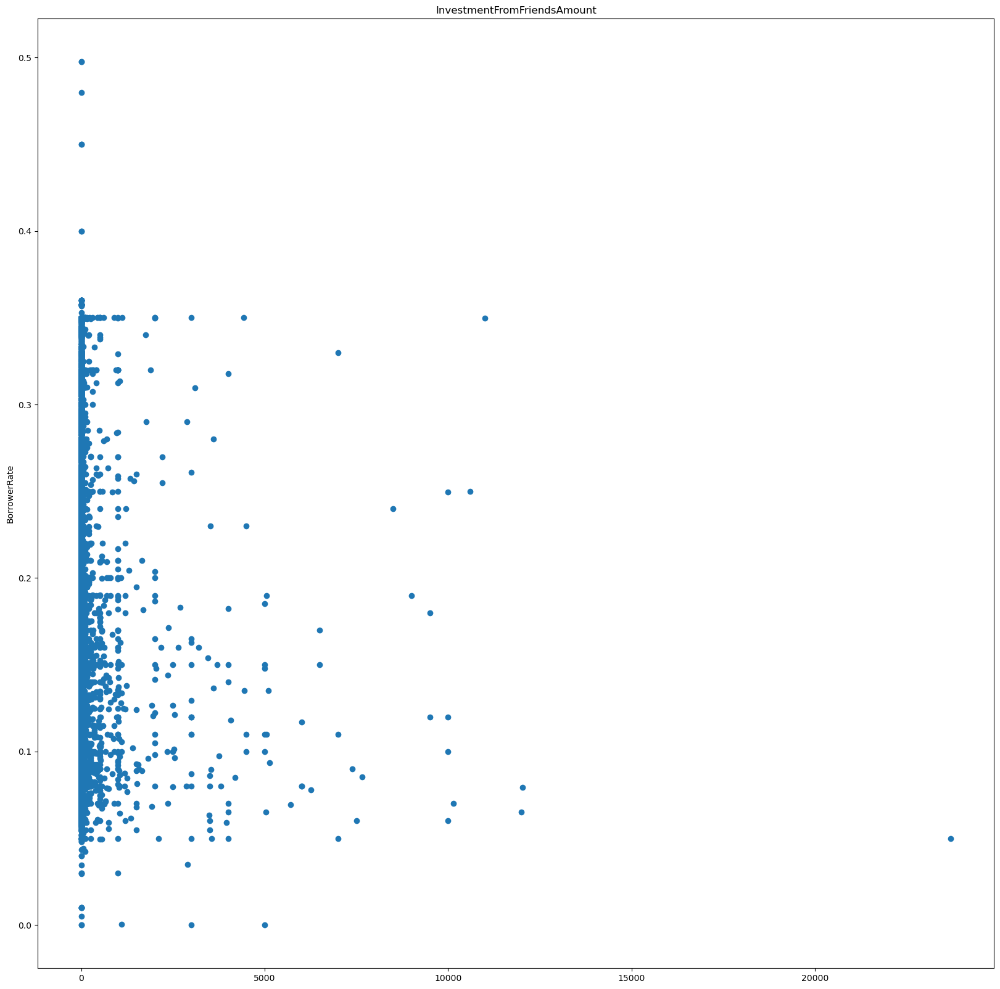

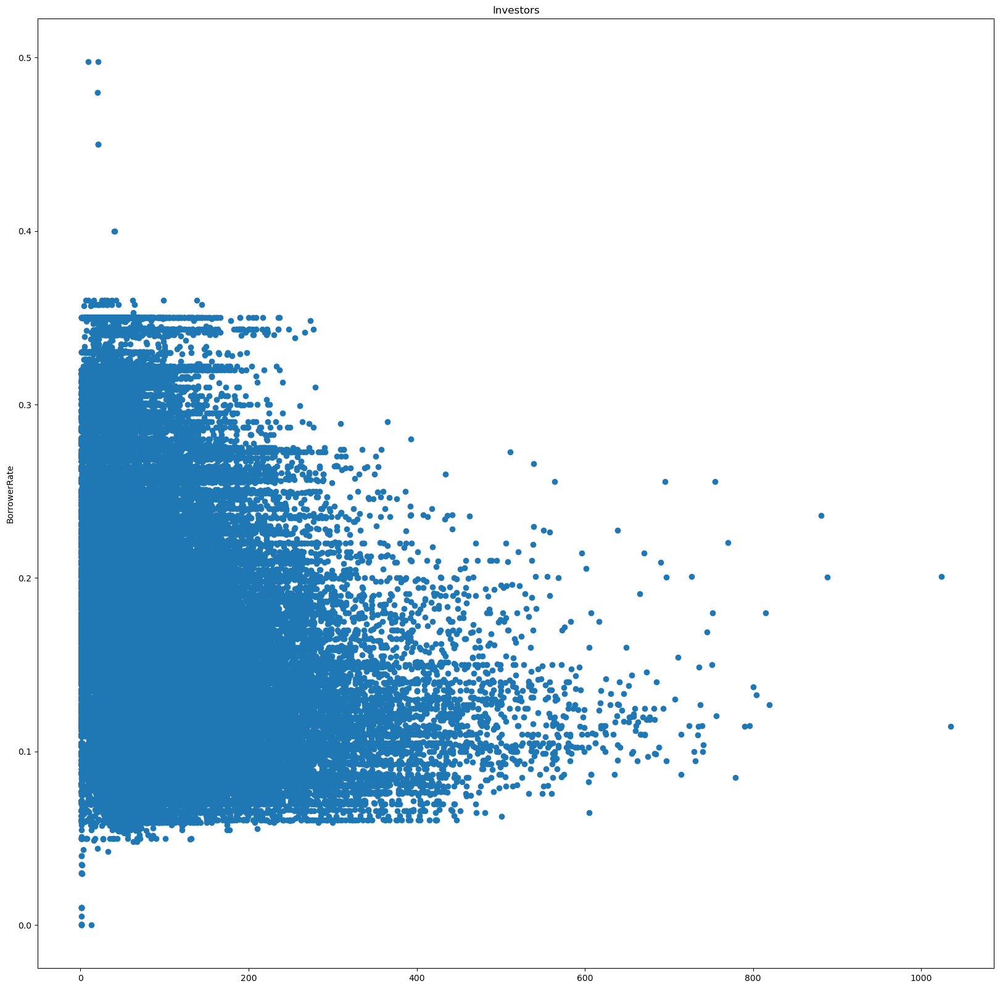

In [44]:
for numeric in num:
    plt.figure(figsize=(20,20))
    plt.scatter(BM_num[numeric], BM_num['BorrowerRate'])
    plt.title(numeric)
    plt.ylabel('BorrowerRate')
    plt.show()

In [45]:
data.corr().abs()

,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperScore,ListingCategory (numeric),EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,CreditScoreRangeLower,CreditScoreRangeUpper,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeVerifiable,StatedMonthlyIncome,LoanCurrentDaysDelinquent,LoanMonthsSinceOrigination,LoanOriginalAmount,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
Term,1.000000,0.014105,0.033311,0.032317,0.041809,0.069080,0.078164,0.065445,0.013853,0.003203,0.087958,0.070932,0.134546,0.076822,0.076822,0.062790,0.082487,0.070989,0.070608,0.066177,0.102866,0.087960,0.047965,0.002085,0.008267,0.011381,0.016050,0.021385,0.030549,0.017571,0.072422,0.072082,0.007397,0.018577,0.045544,0.042650,0.116042,0.353273,0.321491,0.099612,0.117580,0.149910,0.076297,0.094183,NaN,0.033240,0.032936,0.016188,0.002589,0.055413,0.041339,0.023616,0.097151
BorrowerAPR,0.014105,1.000000,0.993019,0.992422,0.821263,0.870751,0.767772,0.844164,0.579775,0.150871,0.007870,0.117332,0.121887,0.469042,0.469042,0.066965,0.070673,0.010826,0.072727,0.007531,0.116190,0.074224,0.126103,0.053676,0.134193,0.115162,0.030042,0.030716,0.275296,0.322799,0.025129,0.214446,0.114918,0.060189,0.106050,0.114718,0.045414,0.150019,0.287800,0.192817,0.056963,0.126859,0.270146,0.047669,NaN,0.060937,0.060923,0.005363,0.003838,0.059603,0.052753,0.032829,0.286842
BorrowerRate,0.033311,0.993019,1.000000,0.999610,0.827408,0.876096,0.786265,0.852755,0.570190,0.133341,0.005354,0.116236,0.081515,0.477701,0.477701,0.070580,0.077437,0.004680,0.082829,0.016886,0.146138,0.103664,0.135990,0.051348,0.132914,0.113408,0.033026,0.035096,0.267037,0.319452,0.031436,0.218816,0.117913,0.067335,0.101181,0.121313,0.081050,0.068952,0.299040,0.208991,0.022959,0.095203,0.298373,0.029945,NaN,0.088191,0.088140,0.011254,0.001016,0.047177,0.044470,0.027923,0.252857
LenderYield,0.032317,0.992422,0.999610,1.000000,0.830396,0.879107,0.788958,0.856069,0.572302,0.133033,0.005695,0.115619,0.085469,0.474058,0.474058,0.070822,0.077731,0.004225,0.083216,0.017509,0.145750,0.102966,0.135525,0.051124,0.132566,0.112809,0.032526,0.035247,0.265619,0.317659,0.031554,0.217414,0.116588,0.066818,0.101216,0.120909,0.079758,0.065127,0.300060,0.209820,0.020034,0.092175,0.299493,0.032764,NaN,0.087877,0.087836,0.010702,0.001010,0.046671,0.043701,0.027586,0.252116
EstimatedEffectiveYield,0.041809,0.821263,0.827408,0.830396,1.000000,0.880146,0.800734,0.884986,0.645600,0.116852,0.020547,0.101455,0.037837,0.357773,0.357773,0.077546,0.087503,0.021873,0.083983,0.031959,0.123314,0.065383,0.101206,0.046968,0.111489,0.093832,0.026573,0.038334,0.209387,0.267621,0.048511,0.190796,0.117021,0.061033,0.084927,0.115564,0.031866,0.008517,0.302151,0.220748,0.037617,0.023432,0.282547,0.015276,NaN,0.076830,0.076763,0.003020,0.004443,0.023200,0.021154,0.008692,0.216656
EstimatedLoss,0.069080,0.870751,0.876096,0.879107,0.880146,1.000000,0.720757,0.971144,0.659098,0.108001,0.028649,0.111214,0.026262,0.394401,0.394401,0.080820,0.091309,0.026851,0.090205,0.040001,0.134078,0.083764,0.099507,0.042586,0.111238,0.094305,0.024776,0.044940,0.226838,0.277391,0.057205,0.198561,0.117482,0.059144,0.094443,0.124029,0.034776,0.029656,0.355251,0.262530,0.024257,0.070911,0.187656,0.118635,NaN,0.041002,0.040932,0.001316,0.004144,0.013712,0.009663,0.000665,0.216098
Estimat

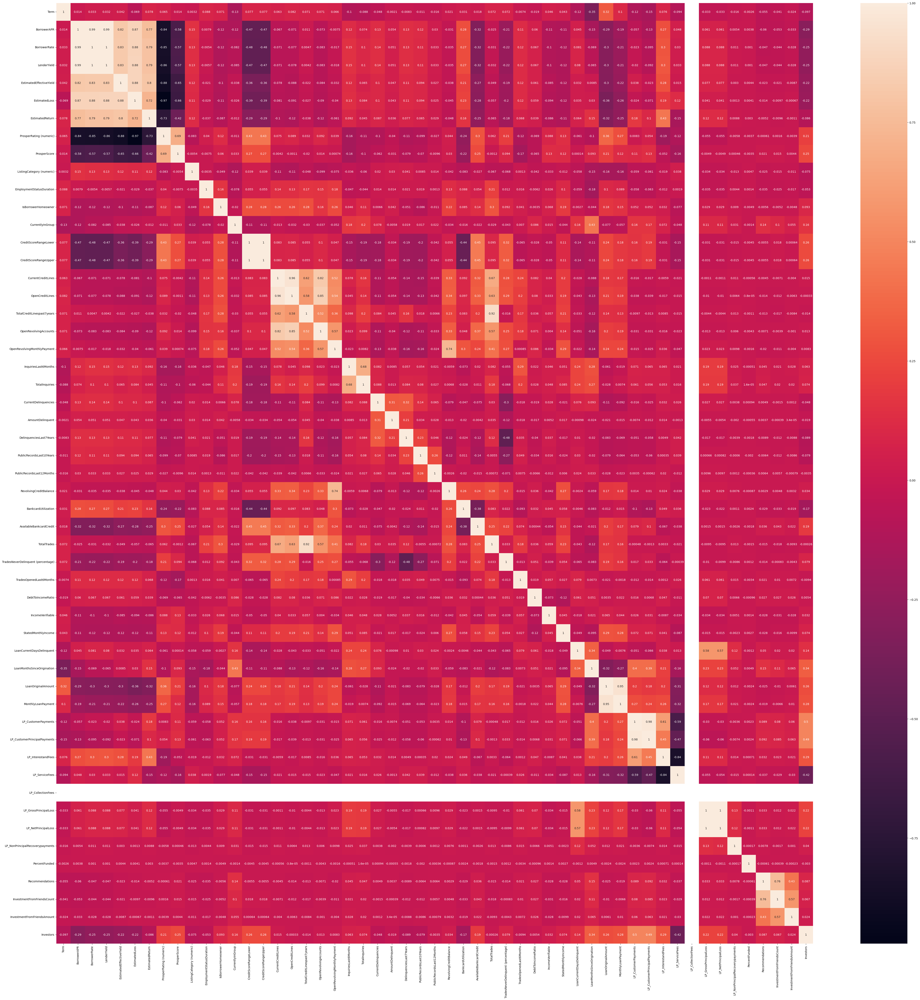

In [46]:
plt.figure(figsize=(60,60)) 
sns.heatmap(data.corr(),annot = True)
plt.show()

### Since there are so much low Credit Grade such as C and D , does it lead to a higher amount of deliquency?

Text(0.5, 0, 'LoanStatus')

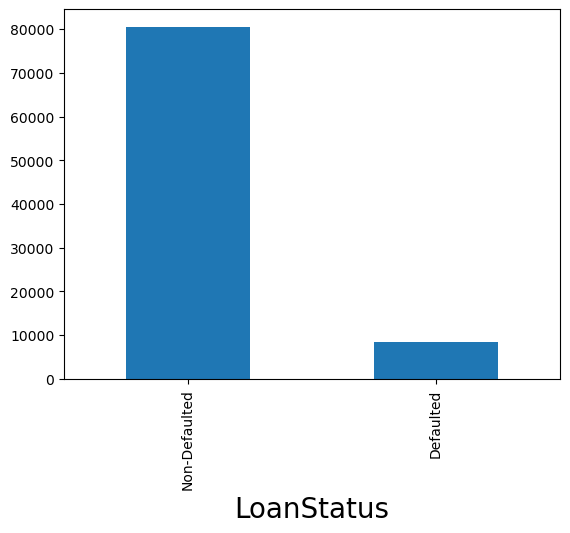

In [47]:
data['LoanStatus'].value_counts().plot.bar()
plt.xlabel('LoanStatus', fontsize=20)

## The highest is : c

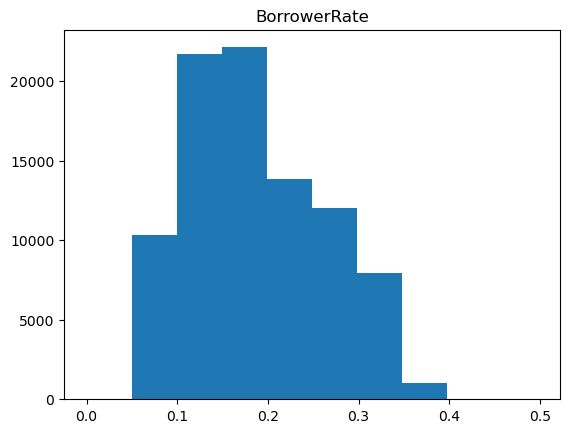

In [48]:
#histogram for numerc columns 
plt.hist(data['BorrowerRate'])
plt.title("BorrowerRate")
plt.show()

##  Highest number is between 0.1 and 0.2

### Since the highest number of Borrower Rate is between 0.1 and 0.2, does the highest number of Lender Yield is between 0.1 and 0.2?

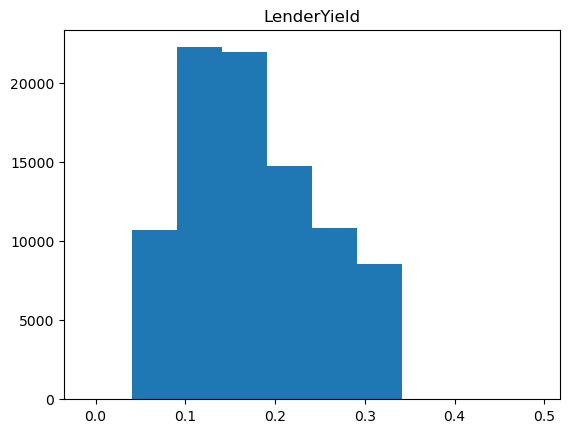

In [49]:
plt.hist(data['LenderYield'])
plt.title("LenderYield")
plt.show()

## Yes ,The highest number of Lender Yield is between 0.1 and 0.2

### Is the Credit Grade really accurate? Does higher Credit Grade leads to higher Monthly Loan Payment? As for Higher Credit Grade we mean from Grade AA to B

##  No, Higher Credit Grade doesn't lead to higher monthly loan payment 

### credit grade seems to be accurate because defaulted borrowers have lower credit grade ('D') than completed 

### Now we know the Credit Grade is accurate and is a tool that is used by the organization in determining the person’s creditworthiness. Now we need to understand does the ProsperScore, the custom built risk assesment system is being used in determing borrower’s rate?

### From a theoretical standpoint, if the higher ProsperScore leads to lower Borrower Rate and Borrower Annual Percentage Rate that means the Prosper Score is being used alongside the Credit Grade in determing a person’s creditworthiness. 

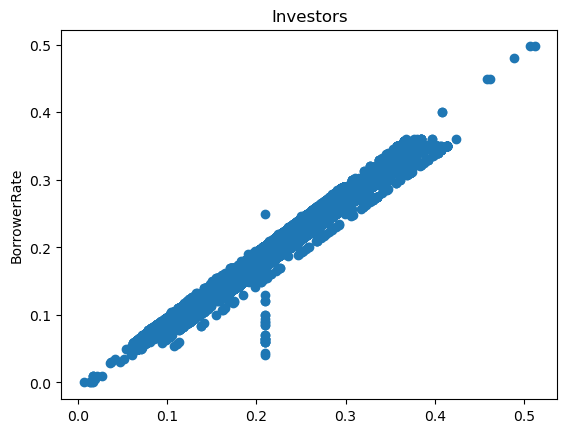

In [50]:
plt.scatter(data['BorrowerAPR'], data['BorrowerRate'])
plt.title(numeric)
plt.ylabel('BorrowerRate')
plt.show()

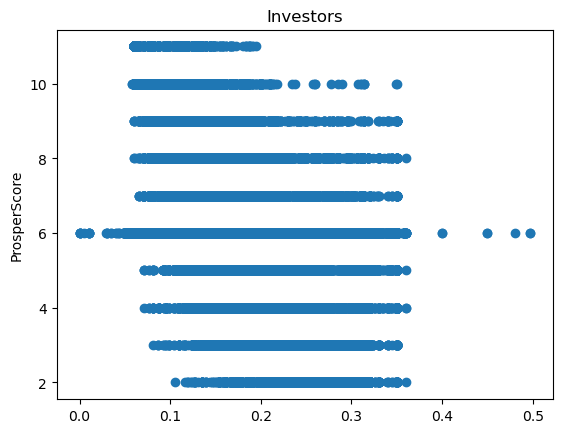

In [51]:
plt.scatter(data['BorrowerRate'], data['ProsperScore'])
plt.title(numeric)
plt.ylabel('ProsperScore')
plt.show()

In [52]:
data['BorrowerRate'].corr(data['ProsperScore'])

-0.5701896819077145

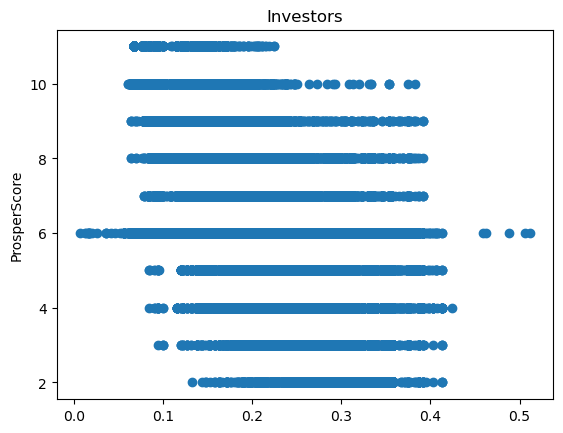

In [53]:
plt.scatter(data['BorrowerAPR'], data['ProsperScore'])
plt.title(numeric)
plt.ylabel('ProsperScore')
plt.show()

In [54]:
data['BorrowerAPR'].corr(data['ProsperScore'])

-0.5797749736335214

### Borrower APR and BorrowerRate are directly correlated but Borrower APR and Prosper score are inversely correlated this means that when prosper score increases borrower apr decreases and borrower rate also increases

# Label encoding 

In [55]:
from sklearn.preprocessing import LabelEncoder
lb= LabelEncoder()

In [56]:
from sklearn.preprocessing import LabelEncoder
lb= LabelEncoder()

col = [ 'ProsperRating (Alpha)' ,'EmploymentStatus' , 
       'BorrowerState','Occupation' ,  'LoanOriginationQuarter' , 'LoanStatus' , 'IncomeRange']
for i in col:

    data[i] = lb.fit_transform(data[i] )

# One Hot Encoding

In [57]:
lis = ['IsBorrowerHomeowner' , 'CurrentlyInGroup' ,'IncomeVerifiable' ]
for i in lis :
    data[i][data[i] == True] = 1
    data[i][data[i] == False] = 0    

/var/folders/zp/513754tn5m7gg_1c1482g26r0000gn/T/ipykernel_2457/430236257.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[i][data[i] == True] = 1
/var/folders/zp/513754tn5m7gg_1c1482g26r0000gn/T/ipykernel_2457/430236257.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[i][data[i] == True] = 1
/var/folders/zp/513754tn5m7gg_1c1482g26r0000gn/T/ipykernel_2457/430236257.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dat

In [58]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 89068 entries, 0 to 113936
Data columns (total 64 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   ListingCreationDate                 89068 non-null  datetime64[ns]
 1   Term                                89068 non-null  int64         
 2   LoanStatus                          89068 non-null  int64         
 3   BorrowerAPR                         89068 non-null  float64       
 4   BorrowerRate                        89068 non-null  float64       
 5   LenderYield                         89068 non-null  float64       
 6   EstimatedEffectiveYield             89068 non-null  float64       
 7   EstimatedLoss                       89068 non-null  float64       
 8   EstimatedReturn                     89068 non-null  float64       
 9   ProsperRating (numeric)             89068 non-null  float64       
 10  ProsperRating (Alpha)

In [59]:
data.head()

,ListingCreationDate,Term,LoanStatus,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),BorrowerState,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,DateCreditPulled,CreditScoreRangeLower,CreditScoreRangeUpper,FirstRecordedCreditLine,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,LoanCurrentDaysDelinquent,LoanMonthsSinceOrigination,LoanOriginalAmount,LoanOriginationDate,LoanOriginationQuarter,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,2007-08-26 19:09:29.263,36,1,0.16516,0.1580,0.1380,0.16150,0.0724,0.09170,4.0,3,6.0,0,5,35,7,2.0,1,1,2007-08-26 18:41:46.780,640.0,659.0,2001-10-11,5.0,4.0,12.0,1,24.0,3.0,3.0,2.0,472.0,4.0,0.0,0.0,0.0,0.00,1500.0,11.0,0.81,0.0,0.17,3,1,3083.333333,0,78,9425,2007-09-12,17,330.43,11396.14,9425.00,1971.14,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,2014-02-27 08:28:07.900,36,1,0.12016,0.0920,0.0820,0.07960,0.0249,0.05470,6.0,0,7.0,2,5,41,0,44.0,0,0,2014-02-27 08:28:14.000,680.0,699.0,1996-03-18,14.0,14.0,29.0,13,389.0,3.0,5.0,0.0,0.0,0.0,1.0,0.0,3989.0,0.21,10266.0,29.0,1.00,2.0,0.18,4,1,6125.000000,0,0,10000,2014-03-03,7,318.93,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
3,2012-10-22 11:02:35.010,36,1,0.12528,0.0974,0.0874,0.08490,0.0249,0.06000,6.0,0,9.0,16,10,50,0,113.0,1,0,2012-10-22 11:02:32.000,800.0,819.0,1983-02-28,5.0,5.0,29.0,7,115.0,0.0,1.0,4.0,10056.0,14.0,0.0,0.0,1444.0,0.04,30754.0,26.0,0.76,0.0,0.15,3,1,2875.000000,0,16,10000,2012-11-01,31,321.45,5143.20,4091.09,1052.11,-108.01,0.0,0.0,0.0,0.0,1.0,0,0,0.0,158
4,2013-09-14 18:38:39.097,36,1,0.24614,0.2085,0.1985,0.18316,0.0925,0.09066,3.0,4,4.0,2,23,19,0,44.0,1,0,2013-09-14 18:38:44.000,680.0,699.0,2004-02-20,19.0,19.0,49.0,6,220.0,1.0,9.0,0.0,0.0,0.0,0.0,0.0,6193.0,0.81,695.0,39.0,0.95,2.0,0.26,2,1,9583.333333,0,6,15000,2013-09-20,23,563.97,2819.85,1563.22,1256.63,-60.27,0.0,0.0,0.0,0.0,1.0,0,0,0.0,20
5,2013-12-14 08:26:37.093,60,1,0.15425,0.1314,0.1214,0.11567,0.0449,0.07077,5.0,2,10.0,1,32,41,0,82.0,1,0,2013-12-14 08:26:40.000,740.0,759.0,1973-03-01,21.0,17.0,49.0,13,1410.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,62999.0,0.39,86509.0,47.0,1.00,0.0,0.36,2,1,8333.333333,0,3,15000,2013-12-24,32,342.37,679.34,351.89,327.45,-25.33,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1


In [60]:
date = ['LoanOriginationDate' , 'FirstRecordedCreditLine' , 'DateCreditPulled' , 'ListingCreationDate']
data.drop(date , axis = 1 , inplace=True)

In [61]:

for i in lis :
    data[i] = data[i].astype(int)


In [62]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 89068 entries, 0 to 113936
Data columns (total 60 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Term                                89068 non-null  int64  
 1   LoanStatus                          89068 non-null  int64  
 2   BorrowerAPR                         89068 non-null  float64
 3   BorrowerRate                        89068 non-null  float64
 4   LenderYield                         89068 non-null  float64
 5   EstimatedEffectiveYield             89068 non-null  float64
 6   EstimatedLoss                       89068 non-null  float64
 7   EstimatedReturn                     89068 non-null  float64
 8   ProsperRating (numeric)             89068 non-null  float64
 9   ProsperRating (Alpha)               89068 non-null  int64  
 10  ProsperScore                        89068 non-null  float64
 11  ListingCategory (numeric)           8906

data.to_csv(r'/Users/ahmed/Downloads/Data after up/data.csv')

In [63]:
x = data.drop('LoanStatus' , axis = 1)
y = data['LoanStatus']

## Mutual Information 

In [64]:
from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(x, y):
    x = x.copy()
    for colname in x.select_dtypes(["object", "category"]):
        x[colname], _ = x[colname].factorize()
    # All discrete features should now have integer dtypes
    discrete_features = [pd.api.types.is_integer_dtype(t) for t in x.dtypes]
    mi_scores = mutual_info_regression(x, y, discrete_features=discrete_features, random_state=0)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=x.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(x, y)
mi_scores[:20]

LoanCurrentDaysDelinquent       0.339414
LP_NetPrincipalLoss             0.313172
LP_GrossPrincipalLoss           0.304851
EstimatedReturn                 0.067519
LoanMonthsSinceOrigination      0.067153
LoanOriginationQuarter          0.065410
EstimatedEffectiveYield         0.064706
BorrowerAPR                     0.063410
LP_CustomerPrincipalPayments    0.061956
LoanOriginalAmount              0.058249
LenderYield                     0.056426
EstimatedLoss                   0.056221
Investors                       0.055750
BorrowerRate                    0.055183
LP_CustomerPayments             0.043566
MonthlyLoanPayment              0.042267
EmploymentStatus                0.029253
ListingCategory (numeric)       0.025031
ProsperScore                    0.024036
ProsperRating (Alpha)           0.021726
Name: MI Scores, dtype: float64

In [65]:
cols_to_drop = x.columns[mi_scores < 0.1]
cols_to_drop

Index(['LenderYield', 'EstimatedEffectiveYield', 'EstimatedLoss',
       'EstimatedReturn', 'ProsperRating (numeric)', 'ProsperRating (Alpha)',
       'ProsperScore', 'ListingCategory (numeric)', 'BorrowerState',
       'Occupation', 'EmploymentStatus', 'EmploymentStatusDuration',
       'IsBorrowerHomeowner', 'CurrentlyInGroup', 'CreditScoreRangeLower',
       'CreditScoreRangeUpper', 'CurrentCreditLines', 'OpenCreditLines',
       'TotalCreditLinespast7years', 'OpenRevolvingAccounts',
       'OpenRevolvingMonthlyPayment', 'InquiriesLast6Months', 'TotalInquiries',
       'CurrentDelinquencies', 'AmountDelinquent', 'DelinquenciesLast7Years',
       'PublicRecordsLast10Years', 'PublicRecordsLast12Months',
       'RevolvingCreditBalance', 'BankcardUtilization',
       'AvailableBankcardCredit', 'TotalTrades',
       'TradesNeverDelinquent (percentage)', 'TradesOpenedLast6Months',
       'DebtToIncomeRatio', 'IncomeRange', 'IncomeVerifiable',
       'StatedMonthlyIncome', 'LoanCurrentDays

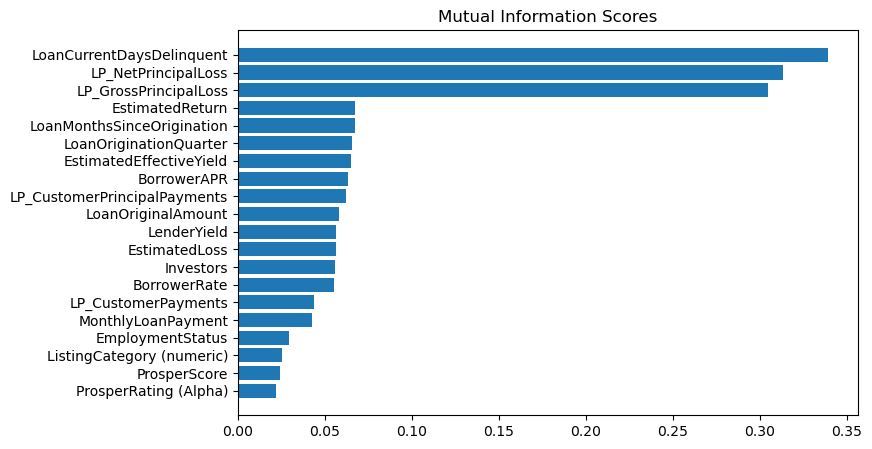

In [66]:
def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")


plt.figure(dpi=100, figsize=(8, 5))
plot_mi_scores(mi_scores.head(20))

 ## no, Past due has low values

##  What is the highest number of BorrowerRate?

In [67]:
data['BorrowerRate'].describe()

count    89068.000000
mean         0.186447
std          0.073135
min          0.000000
25%          0.129800
50%          0.176500
75%          0.241900
max          0.497500
Name: BorrowerRate, dtype: float64

In [68]:
data['IncomeVerifiable'].unique()

array([1, 0])

In [69]:
from sklearn.model_selection import train_test_split

x_train , x_test , y_train , y_test = train_test_split(x,y,random_state=42
                                                       , test_size=0.2 , shuffle=True , stratify=y)

# Applying ML Algo

In [70]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(n_estimators=200 , n_jobs=-1 , max_depth=8 )

In [71]:
model.fit(x_train,y_train)

RandomForestClassifier(max_depth=8, n_estimators=200, n_jobs=-1)

In [72]:
from sklearn.metrics import f1_score , precision_score , recall_score , confusion_matrix

y_pred = model.predict(x_train)

tn, fp, fn, tp = confusion_matrix(y_train, y_pred).ravel()

specificity_tra = round(tn / (tn+fp) , 4)
print('F1_Score' , f1_score(y_train,y_pred))
print('Precision' , precision_score(y_train,y_pred))
print('Recall' , recall_score(y_train,y_pred))
print('Specificity' , specificity_tra)

F1_Score 0.9995655479526446
Precision 0.9991314732385191
Recall 1.0
Specificity 0.9918


In [73]:
y_pred = model.predict(x_test)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

specificity_tra = round(tn / (tn+fp) , 4)
print('F1_Score' , f1_score(y_test,y_pred))
print('Precision' , precision_score(y_test,y_pred))
print('Recall' , recall_score(y_test,y_pred))
print('Specificity' , specificity_tra)

F1_Score 0.9994415141172821
Precision 0.9988836516993302
Recall 1.0
Specificity 0.9895


<a id = 'conclusion'></a>

# Conclusions
From the insights, I can conclude that the monthly income, loan amount and borrower rate are factors that greatly affect the prosper rating which is a good predictor of delinquency.
